In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 29.4 MB/s eta 0:00:00


In [ ]:
url = "https://app.roboflow.com/ds/kxP9tsfIRb?key=Tu7DBx0LHn"

In [ ]:
import requests
import zipfile
import os

def download_and_extract_zip(url, extract_to='.'):
    # Download the file
    print(f"Downloading from {url}...")
    response = requests.get(url, stream=True)
    response.raise_for_status()  # Check if the request was successful

    # Save the zip file
    zip_path = '/content/downloaded_file.zip'
    with open(zip_path, 'wb') as file:
        for chunk in response.iter_content(chunk_size=8192):
            file.write(chunk)

    print("Download completed! Extracting...")

    # Extract the zip file
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)

    print(f"Extraction completed to {extract_to}")

    # Optional: Remove the zip file after extraction
    os.remove(zip_path)
    print("Zip file removed.")

    return extract_to

# Usage
dataset_path = download_and_extract_zip(url, '/content/dataset')

Download completed! Extracting...
Extraction completed to /content/dataset
Zip file removed.


In [ ]:
import zipfile
import os

# Unzip the dataset
with zipfile.ZipFile('/content/smd-component-detection.v1i.yolov8-obb.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/dataset')

print("Dataset extracted successfully!")

In [ ]:
from ultralytics import YOLO
import os

def train_yolov8_obb():
    # Initialize model
    model = YOLO('yolov8n-obb.pt')

    # Training parameters
    training_params = {
        'data': '/content/dataset/data.yaml',
        'epochs': 100,
        'imgsz': 640,
        'batch': 16,
        'device': 0,
        'workers': 8,
        'patience': 20,
        'save': True,
        'save_period': 10,
        'amp': True,  # automatic mixed precision
    }

    # Start training
    results = model.train(**training_params)

    # Validate
    metrics = model.val()
    print(f"Validation mAP50: {metrics.box.map50:.4f}")
    print(f"Validation mAP50-95: {metrics.box.map:.4f}")

    return model, results

In [ ]:
model, results = train_yolov8_obb()

Ultralytics 8.3.221 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-obb.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=20, perspective=0.0, plots=True, pose=1

In [ ]:
import shutil
import os

def zip_folder(folder_path, output_zip_name):
    """Zip a folder and download it"""

    # Create zip file
    shutil.make_archive(output_zip_name.replace('.zip', ''), 'zip', folder_path)

    print(f"Folder '{folder_path}' zipped as '{output_zip_name}'")
    return output_zip_name

# Usage
folder_to_zip = '/content/runs'  # Change this to your folder path
zip_filename = 'runs.zip'

zip_path = zip_folder(folder_to_zip, zip_filename)

# Download the zip file
from google.colab import files
files.download(zip_path)

Folder '/content/runs' zipped as 'runs.zip'


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import cv2
import numpy as np
import os
import yaml
from pathlib import Path
import math
import shutil

def rotate_point(x, y, cx, cy, angle_rad):
    """Rotate a point around center (cx, cy) by angle_rad radians"""
    cos_angle = math.cos(angle_rad)
    sin_angle = math.sin(angle_rad)

    # Translate point to origin
    x_translated = x - cx
    y_translated = y - cy

    # Rotate (counter-clockwise for positive angles)
    x_rotated = x_translated * cos_angle - y_translated * sin_angle
    y_rotated = x_translated * sin_angle + y_translated * cos_angle

    # Translate back
    x_final = x_rotated + cx
    y_final = y_rotated + cy

    return x_final, y_final

def rotate_image_and_bboxes_fixed(image_path, label_path, angle_degrees):
    """Rotate image and its OBB annotations - FIXED VERSION"""
    # Read image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Could not read image: {image_path}")
        return None, []

    h, w = image.shape[:2]
    center = (w // 2, h // 2)

    # Calculate new dimensions to avoid cropping
    angle_rad = math.radians(abs(angle_degrees))
    new_w = int(w * abs(math.cos(angle_rad)) + h * abs(math.sin(angle_rad)))
    new_h = int(h * abs(math.cos(angle_rad)) + w * abs(math.sin(angle_rad)))

    # Adjust rotation matrix for new dimensions
    rotation_matrix = cv2.getRotationMatrix2D(center, angle_degrees, 1.0)
    rotation_matrix[0, 2] += (new_w - w) / 2
    rotation_matrix[1, 2] += (new_h - h) / 2

    # Rotate image with border (to maintain all content)
    rotated_image = cv2.warpAffine(image, rotation_matrix, (new_w, new_h),
                                  flags=cv2.INTER_LINEAR,
                                  borderMode=cv2.BORDER_CONSTANT,
                                  borderValue=(114, 114, 114))  # Gray border

    # Read and rotate OBB annotations
    rotated_annotations = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) != 9:  # OBB format: class x1 y1 x2 y2 x3 y3 x4 y4
                    continue

                class_id = int(parts[0])
                points = list(map(float, parts[1:]))

                # Convert normalized coordinates to absolute (in ORIGINAL image coordinates)
                abs_points = []
                for i in range(0, 8, 2):
                    x = points[i] * w
                    y = points[i+1] * h
                    abs_points.extend([x, y])

                # Rotate each point and adjust for new dimensions
                rotated_points = []
                for i in range(0, 8, 2):
                    # Rotate point
                    rx, ry = rotate_point(abs_points[i], abs_points[i+1], center[0], center[1], math.radians(angle_degrees))

                    # Adjust for the border added during rotation
                    rx += (new_w - w) / 2
                    ry += (new_h - h) / 2

                    # Convert back to normalized coordinates (using NEW dimensions)
                    rotated_points.extend([rx / new_w, ry / new_h])

                # Ensure points are within [0, 1] range
                rotated_points = [max(0, min(1, p)) for p in rotated_points]

                # Only keep valid OBBs (all points should form a proper quadrilateral)
                if is_valid_obb(rotated_points):
                    rotated_annotations.append(f"{class_id} " + " ".join(f"{p:.6f}" for p in rotated_points))

    return rotated_image, rotated_annotations

def is_valid_obb(points):
    """Check if OBB points form a valid quadrilateral"""
    if len(points) != 8:
        return False

    # Check if all points are within [0, 1] range
    for p in points:
        if p < 0 or p > 1:
            return False

    # Check if points form a convex quadrilateral (simple area check)
    x_coords = [points[i] for i in range(0, 8, 2)]
    y_coords = [points[i+1] for i in range(0, 8, 2)]

    # Calculate area using shoelace formula
    area = 0.5 * abs(
        x_coords[0]*y_coords[1] + x_coords[1]*y_coords[2] +
        x_coords[2]*y_coords[3] + x_coords[3]*y_coords[0] -
        y_coords[0]*x_coords[1] - y_coords[1]*x_coords[2] -
        y_coords[2]*x_coords[3] - y_coords[3]*x_coords[0]
    )

    return area > 0.001  # Minimum area threshold

def augment_dataset_with_rotations_fixed(dataset_path, angles_range=(-45, 45), step=15, overwrite_existing=True):
    """Augment entire dataset with rotations - FIXED VERSION"""
    dataset_path = Path(dataset_path)

    # Create augmented directory structure
    augmented_dir = dataset_path / 'augmented_fixed'

    # Remove existing directory if overwrite is True
    if overwrite_existing and augmented_dir.exists():
        shutil.rmtree(augmented_dir)
        print("Removed existing augmented directory")

    (augmented_dir / 'test' / 'images').mkdir(parents=True, exist_ok=True)
    (augmented_dir / 'test' / 'labels').mkdir(parents=True, exist_ok=True)
    (augmented_dir / 'train' / 'images').mkdir(parents=True, exist_ok=True)
    (augmented_dir / 'train' / 'labels').mkdir(parents=True, exist_ok=True)

    # Generate rotation angles
    angles = list(range(angles_range[0], angles_range[1] + 1, step))
    print(f"Generating rotations for angles: {angles}")

    # Process train and test sets
    for split in ['train', 'test']:
        split_images_dir = dataset_path / split / 'images'
        split_labels_dir = dataset_path / split / 'labels'

        if not split_images_dir.exists():
            print(f"Skipping {split} - directory not found")
            continue

        image_files = list(split_images_dir.glob('*.*'))
        image_files = [f for f in image_files if f.suffix.lower() in ['.jpg', '.jpeg', '.png', '.bmp']]

        print(f"Processing {split} set: {len(image_files)} images")

        for img_path in image_files:
            # Original label path
            label_path = split_labels_dir / f"{img_path.stem}.txt"

            # Copy original (0 degree rotation)
            shutil.copy2(img_path, augmented_dir / split / 'images' / img_path.name)
            if label_path.exists():
                shutil.copy2(label_path, augmented_dir / split / 'labels' / f"{img_path.stem}.txt")

            # Generate rotated versions
            for angle in angles:
                if angle == 0:  # Skip 0 degree (original)
                    continue

                rotated_img, rotated_annos = rotate_image_and_bboxes_fixed(
                    str(img_path), str(label_path), angle
                )

                if rotated_img is not None:
                    # Save rotated image
                    rotated_img_name = f"{img_path.stem}_rot{angle}{img_path.suffix}"
                    rotated_img_path = augmented_dir / split / 'images' / rotated_img_name
                    cv2.imwrite(str(rotated_img_path), rotated_img)

                    # Save rotated annotations
                    if rotated_annos:
                        rotated_label_name = f"{img_path.stem}_rot{angle}.txt"
                        rotated_label_path = augmented_dir / split / 'labels' / rotated_label_name
                        with open(rotated_label_path, 'w') as f:
                            f.write('\n'.join(rotated_annos))
                #         print(f"  Created: {rotated_img_name} with {len(rotated_annos)} OBBs")
                #     else:
                #         print(f"  Warning: No valid OBBs for {rotated_img_name}")
                # else:
                #     print(f"  Failed to rotate: {img_path.name} at angle {angle}")

        print(f"Completed {split} set augmentation")

    return augmented_dir

# Usage - THIS WILL OVERWRITE EXISTING FILES
dataset_path = "/content/dataset"  # Your dataset folder
augmented_dir = augment_dataset_with_rotations_fixed(
    dataset_path,
    angles_range=(-45, 45),
    step=15,
    overwrite_existing=True  # This will remove old broken images
)

Generating rotations for angles: [-45, -30, -15, 0, 15, 30, 45]
Processing train set: 2153 images
Completed train set augmentation
Processing test set: 312 images
Completed test set augmentation


In [ ]:
augmented_dir = '/content/dataset/augmented'

In [ ]:
new_yaml_path = augmented_dir + '/data_augmented.yaml'

In [ ]:
print(new_yaml_path)

/content/dataset/augmented/data_augmented.yaml


In [ ]:
def update_yaml_for_augmented_dataset(original_yaml_path, augmented_dir):
    """Update data.yaml for augmented dataset - SIMPLIFIED"""

    with open(original_yaml_path, 'r') as f:
        yaml_data = yaml.safe_load(f)

    # Update paths to point to augmented dataset
    augmented_dir = Path(augmented_dir)
    yaml_data['path'] = str(augmented_dir)

    # Direct path assignment - no conditional logic needed
    yaml_data['train'] = str(augmented_dir / 'train' / 'images')
    yaml_data['val'] = str(augmented_dir / 'test' / 'images')  # Use test as val

    # Save updated YAML
    new_yaml_path = augmented_dir / 'data_augmented.yaml'
    with open(new_yaml_path, 'w') as f:
        yaml.dump(yaml_data, f, default_flow_style=False)

    print(f"Updated YAML saved to: {new_yaml_path}")
    return new_yaml_path

# Usage
original_yaml = "/content/dataset/data.yaml"
new_yaml = update_yaml_for_augmented_dataset(original_yaml, augmented_dir)

Updated YAML saved to: /content/dataset/augmented_fixed/data_augmented.yaml


In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8n-obb.pt')  # or yolov8s-obb.pt, yolov8m-obb.pt, etc.

# Train the model
results = model.train(
    data='/content/dataset/augmented_fixed/data_augmented.yaml',
    epochs=100,
    patience=50,
    batch=16,
    imgsz=640,
    save=True,
    save_period=10,
    cache=False,
    device=0,
    workers=8,
    single_cls=False,  # set to True for single class
    optimizer='AdamW',
    lr0=0.001,
    augment=True,
    rect=False,
    cos_lr=True,
    close_mosaic=10
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.221 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/dataset/augmented_fixed/data_augmented.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=Fal

Found 15071 images in augmented dataset


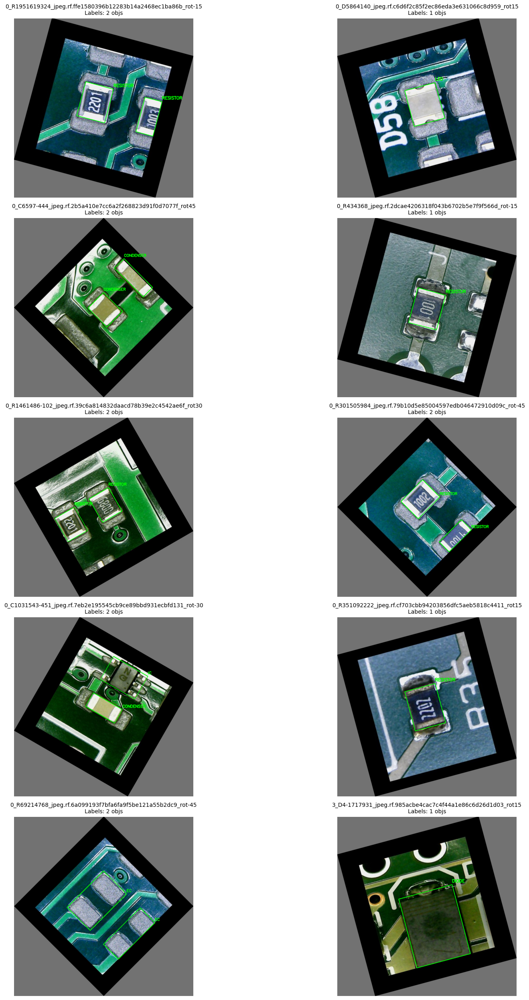

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import yaml
from pathlib import Path
import os

def visualize_augmented_samples(yaml_path, num_samples=10):
    """Visualize random samples from augmented dataset to verify OBB annotations"""

    # Load YAML file
    with open(yaml_path, 'r') as f:
        yaml_data = yaml.safe_load(f)

    # Get paths from YAML
    dataset_path = Path(yaml_data['path'])
    train_images_path = dataset_path / 'train' / 'images'

    # Get all image files
    image_files = list(train_images_path.glob('*.*'))
    image_files = [f for f in image_files if f.suffix.lower() in ['.jpg', '.jpeg', '.png', '.bmp']]

    print(f"Found {len(image_files)} images in augmented dataset")

    # Select random samples
    selected_images = random.sample(image_files, min(num_samples, len(image_files)))

    # Create subplot grid
    cols = 2
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten() if rows > 1 else [axes] if cols == 1 else axes

    for idx, (img_path, ax) in enumerate(zip(selected_images, axes)):
        # Load image
        image = cv2.imread(str(img_path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Load corresponding label
        label_path = dataset_path / 'train' / 'labels' / f"{img_path.stem}.txt"

        # Draw original image
        display_image = image.copy()

        if label_path.exists():
            with open(label_path, 'r') as f:
                lines = f.readlines()

            # Draw OBB annotations
            for line in lines:
                parts = line.strip().split()
                if len(parts) == 9:  # OBB format
                    class_id = int(parts[0])
                    points = list(map(float, parts[1:]))

                    # Convert normalized to absolute coordinates
                    h, w = image.shape[:2]
                    abs_points = []
                    for i in range(0, 8, 2):
                        x = int(points[i] * w)
                        y = int(points[i+1] * h)
                        abs_points.append([x, y])

                    # Draw rotated bounding box
                    abs_points = np.array(abs_points, dtype=np.int32)
                    cv2.polylines(display_image, [abs_points], isClosed=True,
                                 color=(0, 255, 0), thickness=2)

                    # Draw class label
                    class_name = yaml_data['names'].get(class_id, f"Class_{class_id}")
                    cv2.putText(display_image, class_name,
                               (abs_points[0][0], abs_points[0][1] - 10),
                               cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

        # Display
        ax.imshow(display_image)
        ax.set_title(f"{img_path.stem}\nLabels: {len(lines) if label_path.exists() else 0} objs",
                    fontsize=10)
        ax.axis('off')

    # Hide empty subplots
    for idx in range(len(selected_images), len(axes)):
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

    return selected_images

# Usage
yaml_path = "/content/dataset/augmented_fixed/data_augmented.yaml"
selected_images = visualize_augmented_samples(yaml_path, num_samples=10)

In [ ]:
import os
import numpy as np
from pathlib import Path
import math

def fix_inverted_obb_rotations(augmented_dir):
    """Fix the inverted OBB rotations in the augmented dataset"""

    aug_dir = Path(augmented_dir)

    print("🔧 Fixing inverted OBB rotations...")

    for split in ['train', 'test']:
        images_dir = aug_dir / split / 'images'
        labels_dir = aug_dir / split / 'labels'

        if not images_dir.exists():
            continue

        # Get all rotated label files
        rotated_labels = [f for f in labels_dir.glob('*_rot*.txt')]
        print(f"\n{split.upper()} - Fixing {len(rotated_labels)} rotated label files")

        fixed_count = 0
        for label_path in rotated_labels:
            # Extract rotation angle from filename
            angle_str = label_path.stem.split('_rot')[-1]
            try:
                applied_angle = int(angle_str)
            except:
                continue

            # Read the current (inverted) annotations
            with open(label_path, 'r') as f:
                lines = f.readlines()

            # Get corresponding image to get dimensions
            img_path = images_dir / f"{label_path.stem}.jpg"  # Adjust extension if needed
            if not img_path.exists():
                img_path = images_dir / f"{label_path.stem}.png"
            if not img_path.exists():
                img_path = images_dir / f"{label_path.stem}.jpeg"

            if not img_path.exists():
                print(f"  Warning: Image not found for {label_path.name}")
                continue

            # Load image to get dimensions
            image = cv2.imread(str(img_path))
            if image is None:
                continue

            h, w = image.shape[:2]
            center = (w // 2, h // 2)

            fixed_annotations = []

            for line in lines:
                parts = line.strip().split()
                if len(parts) != 9:
                    continue

                class_id = int(parts[0])
                points = list(map(float, parts[1:]))

                # Convert normalized coordinates to absolute
                abs_points = []
                for i in range(0, 8, 2):
                    x = points[i] * w
                    y = points[i+1] * h
                    abs_points.extend([x, y])

                # FIX: Rotate points in the OPPOSITE direction to correct the inversion
                fixed_points = []
                for i in range(0, 8, 2):
                    # Rotate in the opposite direction to fix the inversion
                    rx, ry = rotate_point(abs_points[i], abs_points[i+1], center[0], center[1], math.radians(-applied_angle))
                    # Convert back to normalized coordinates
                    fixed_points.extend([rx / w, ry / h])

                # Ensure points are within [0, 1] range
                fixed_points = [max(0, min(1, p)) for p in fixed_points]

                fixed_annotations.append(f"{class_id} " + " ".join(f"{p:.6f}" for p in fixed_points))

            # Overwrite the label file with corrected annotations
            with open(label_path, 'w') as f:
                f.write('\n'.join(fixed_annotations))

            fixed_count += 1

        print(f"  Fixed {fixed_count} label files")

    print("✅ OBB rotation inversion fix completed!")

def rotate_point(x, y, cx, cy, angle_rad):
    """Rotate a point around center (cx, cy) by angle_rad radians"""
    cos_angle = math.cos(angle_rad)
    sin_angle = math.sin(angle_rad)

    # Translate point to origin
    x_translated = x - cx
    y_translated = y - cy

    # Rotate
    x_rotated = x_translated * cos_angle - y_translated * sin_angle
    y_rotated = x_translated * sin_angle + y_translated * cos_angle

    # Translate back
    x_final = x_rotated + cx
    y_final = y_rotated + cy

    return x_final, y_final

# Usage - Run this on your existing augmented dataset
augmented_dir = "/content/dataset/augmented_fixed"  # Your existing augmented directory
fix_inverted_obb_rotations(augmented_dir)

🔧 Fixing inverted OBB rotations...

TRAIN - Fixing 11382 rotated label files
  Fixed 11382 label files

TEST - Fixing 1638 rotated label files
  Fixed 1638 label files
✅ OBB rotation inversion fix completed!


In [ ]:
import cv2
import numpy as np
import os
import yaml
from pathlib import Path
import math
import shutil

def rotate_point(x, y, cx, cy, angle_rad):
    """Rotate a point around center (cx, cy) by angle_rad radians"""
    cos_angle = math.cos(angle_rad)
    sin_angle = math.sin(angle_rad)

    # Translate point to origin
    x_translated = x - cx
    y_translated = y - cy

    # Rotate (using same direction as cv2)
    x_rotated = x_translated * cos_angle - y_translated * sin_angle
    y_rotated = x_translated * sin_angle + y_translated * cos_angle

    # Translate back
    x_final = x_rotated + cx
    y_final = y_rotated + cy

    return x_final, y_final

def rotate_image_and_bboxes(image_path, label_path, angle_degrees):
    """Rotate image and its OBB annotations with consistent rotation direction"""
    # Read image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Could not read image: {image_path}")
        return None, []

    h, w = image.shape[:2]
    center = (w // 2, h // 2)

    # IMPORTANT: Use the SAME angle for both image and OBB
    # cv2.rotate uses positive angle for counter-clockwise rotation
    angle_rad = math.radians(angle_degrees)  # Same sign for both

    # Rotation matrix for image
    rotation_matrix = cv2.getRotationMatrix2D(center, angle_degrees, 1.0)

    # Rotate image
    rotated_image = cv2.warpAffine(image, rotation_matrix, (w, h), flags=cv2.INTER_LINEAR)

    # Read and rotate OBB annotations with SAME rotation
    rotated_annotations = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) != 9:  # OBB format: class x1 y1 x2 y2 x3 y3 x4 y4
                    continue

                class_id = int(parts[0])
                points = list(map(float, parts[1:]))

                # Convert normalized coordinates to absolute
                abs_points = []
                for i in range(0, 8, 2):
                    x = points[i] * w
                    y = points[i+1] * h
                    abs_points.extend([x, y])

                # Rotate each point with SAME angle
                rotated_points = []
                for i in range(0, 8, 2):
                    rx, ry = rotate_point(abs_points[i], abs_points[i+1], center[0], center[1], angle_rad)
                    # Convert back to normalized coordinates
                    rotated_points.extend([rx / w, ry / h])

                # Ensure points are within [0, 1] range
                rotated_points = [max(0, min(1, p)) for p in rotated_points]

                rotated_annotations.append(f"{class_id} " + " ".join(f"{p:.6f}" for p in rotated_points))

    return rotated_image, rotated_annotations

def augment_dataset_with_consistent_rotations(dataset_path, angles_range=(-45, 45), step=15):
    """Augment dataset with consistent image and OBB rotations"""
    dataset_path = Path(dataset_path)

    # Create augmented directory structure
    augmented_dir = dataset_path / 'augmented_consistent'
    (augmented_dir / 'test' / 'images').mkdir(parents=True, exist_ok=True)
    (augmented_dir / 'test' / 'labels').mkdir(parents=True, exist_ok=True)
    (augmented_dir / 'train' / 'images').mkdir(parents=True, exist_ok=True)
    (augmented_dir / 'train' / 'labels').mkdir(parents=True, exist_ok=True)

    # Generate rotation angles
    angles = list(range(angles_range[0], angles_range[1] + 1, step))
    print(f"Generating rotations for angles: {angles}")

    # Process train and test sets
    for split in ['train', 'test']:
        split_images_dir = dataset_path / split / 'images'
        split_labels_dir = dataset_path / split / 'labels'

        if not split_images_dir.exists():
            print(f"Skipping {split} - directory not found")
            continue

        image_files = list(split_images_dir.glob('*.*'))
        image_files = [f for f in image_files if f.suffix.lower() in ['.jpg', '.jpeg', '.png', '.bmp']]

        print(f"Processing {split} set: {len(image_files)} images")

        for img_path in image_files:
            # Original label path
            label_path = split_labels_dir / f"{img_path.stem}.txt"

            # Copy original (0 degree rotation)
            shutil.copy2(img_path, augmented_dir / split / 'images' / img_path.name)
            if label_path.exists():
                shutil.copy2(label_path, augmented_dir / split / 'labels' / f"{img_path.stem}.txt")

            # Generate rotated versions
            for angle in angles:
                if angle == 0:  # Skip 0 degree (original)
                    continue

                rotated_img, rotated_annos = rotate_image_and_bboxes(
                    str(img_path), str(label_path), angle  # Same angle for both
                )

                if rotated_img is not None:
                    # Save rotated image
                    rotated_img_name = f"{img_path.stem}_rot{angle}{img_path.suffix}"
                    rotated_img_path = augmented_dir / split / 'images' / rotated_img_name
                    cv2.imwrite(str(rotated_img_path), rotated_img)

                    # Save rotated annotations
                    if rotated_annos:
                        rotated_label_name = f"{img_path.stem}_rot{angle}.txt"
                        rotated_label_path = augmented_dir / split / 'labels' / rotated_label_name
                        with open(rotated_label_path, 'w') as f:
                            f.write('\n'.join(rotated_annos))
                    else:
                        print(f"Warning: No annotations for {rotated_img_name}")

        print(f"Completed {split} set augmentation")

    return augmented_dir

In [ ]:
def verify_rotation_consistency(augmented_dir, num_samples=5):
    """Verify that image rotation matches OBB rotation"""

    aug_dir = Path(augmented_dir)

    print("🔍 Verifying rotation consistency...")

    for split in ['train', 'test']:
        images_dir = aug_dir / split / 'images'
        labels_dir = aug_dir / split / 'labels'

        if not images_dir.exists():
            continue

        # Find rotated images
        rotated_images = [f for f in images_dir.glob('*.*') if '_rot' in f.stem]
        print(f"\n{split.upper()} SET - Rotated images: {len(rotated_images)}")

        # Check a few samples
        samples = random.sample(rotated_images, min(num_samples, len(rotated_images)))

        for img_path in samples:
            # Extract rotation angle from filename
            angle_str = img_path.stem.split('_rot')[-1]
            try:
                applied_angle = int(angle_str)
            except:
                continue

            # Load image and annotations
            image = cv2.imread(str(img_path))
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            label_path = labels_dir / f"{img_path.stem}.txt"

            if label_path.exists():
                with open(label_path, 'r') as f:
                    lines = f.readlines()

                if lines:
                    # Calculate actual OBB angle from annotations
                    parts = lines[0].strip().split()
                    if len(parts) == 9:
                        points = list(map(float, parts[1:]))

                        # Convert to absolute coordinates
                        h, w = image.shape[:2]
                        abs_points = []
                        for i in range(0, 8, 2):
                            x = points[i] * w
                            y = points[i+1] * h
                            abs_points.append([x, y])

                        # Calculate OBB orientation angle
                        if len(abs_points) >= 2:
                            dx = abs_points[1][0] - abs_points[0][0]
                            dy = abs_points[1][1] - abs_points[0][1]
                            obb_angle = np.degrees(np.arctan2(dy, dx))

                            print(f"  {img_path.name}:")
                            print(f"    Applied rotation: {applied_angle}°")
                            print(f"    OBB orientation: {obb_angle:.1f}°")
                            print(f"    Difference: {abs(obb_angle - applied_angle):.1f}°")

def visualize_rotation_verification(augmented_dir, num_samples=4):
    """Visualize to verify rotation consistency"""

    aug_dir = Path(augmented_dir)

    # Find original and rotated pairs
    images_dir = aug_dir / 'train' / 'images'
    labels_dir = aug_dir / 'train' / 'labels'

    # Get original images
    original_images = [f for f in images_dir.glob('*.*') if '_rot' not in f.stem]

    if not original_images:
        print("No original images found!")
        return

    # Select a few originals and find their rotations
    samples = random.sample(original_images, min(num_samples, len(original_images)))

    for orig_img_path in samples:
        orig_stem = orig_img_path.stem

        # Find rotations of this image
        rotations = []
        for angle in [-30, 0, 30]:  # Check key rotations
            if angle == 0:
                img_path = orig_img_path
                rot_name = "Original"
            else:
                rot_path = images_dir / f"{orig_stem}_rot{angle}{orig_img_path.suffix}"
                if rot_path.exists():
                    img_path = rot_path
                    rot_name = f"Rotated {angle}°"
                else:
                    continue

            rotations.append((img_path, rot_name))

        # Create comparison plot
        fig, axes = plt.subplots(1, len(rotations), figsize=(5 * len(rotations), 5))

        if len(rotations) == 1:
            axes = [axes]

        for idx, (img_path, title) in enumerate(rotations):
            image = cv2.imread(str(img_path))
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            display_image = image_rgb.copy()

            # Draw OBB annotations
            label_path = labels_dir / f"{img_path.stem}.txt"
            if label_path.exists():
                with open(label_path, 'r') as f:
                    lines = f.readlines()

                for line in lines:
                    parts = line.strip().split()
                    if len(parts) == 9:
                        points = list(map(float, parts[1:]))

                        h, w = image.shape[:2]
                        abs_points = []
                        for i in range(0, 8, 2):
                            x = int(points[i] * w)
                            y = int(points[i+1] * h)
                            abs_points.append([x, y])

                        # Draw OBB
                        abs_points_np = np.array(abs_points, dtype=np.int32)
                        cv2.polylines(display_image, [abs_points_np], True, (0, 255, 0), 3)

                        # Draw orientation line
                        if len(abs_points) >= 2:
                            cv2.arrowedLine(display_image,
                                          tuple(abs_points[0]),
                                          tuple(abs_points[1]),
                                          (255, 0, 0), 2)

            axes[idx].imshow(display_image)
            axes[idx].set_title(title, fontsize=14)
            axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

In [ ]:
# Run the fixed augmentation
dataset_path = "/content/dataset"
augmented_dir = augment_dataset_with_consistent_rotations(
    dataset_path,
    angles_range=(-45, 45),
    step=15
)

# Verify the results
verify_rotation_consistency(augmented_dir)
visualize_rotation_verification(augmented_dir)

# Update YAML
def update_yaml_for_fixed_augmentation(original_yaml_path, augmented_dir):
    """Update YAML for the fixed augmented dataset"""

    with open(original_yaml_path, 'r') as f:
        yaml_data = yaml.safe_load(f)

    augmented_dir = Path(augmented_dir)
    yaml_data['path'] = str(augmented_dir)
    yaml_data['train'] = str(augmented_dir / 'train' / 'images')
    yaml_data['val'] = str(augmented_dir / 'test' / 'images')

    new_yaml_path = augmented_dir / 'data_augmented_consistent.yaml'
    with open(new_yaml_path, 'w') as f:
        yaml.dump(yaml_data, f, default_flow_style=False)

    print(f"✅ Fixed YAML saved to: {new_yaml_path}")
    return new_yaml_path

# Update YAML
original_yaml = Path(dataset_path) / 'data.yaml'
new_yaml = update_yaml_for_fixed_augmentation(original_yaml, augmented_dir)

Generating rotations for angles: [-45, -30, -15, 0, 15, 30, 45]
Processing train set: 2153 images


KeyboardInterrupt: 

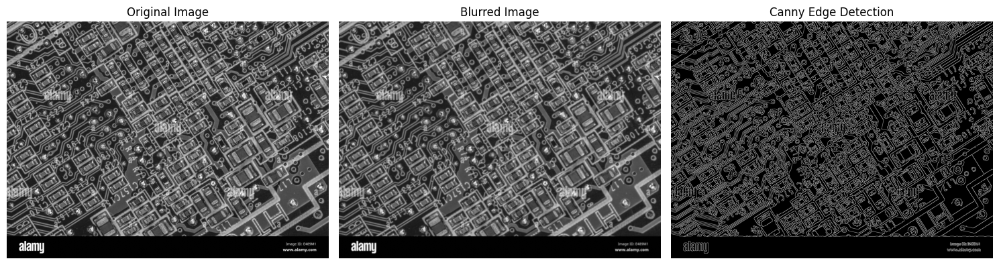

In [4]:
import cv2
import matplotlib.pyplot as plt

def detect_edges(image_path, low_threshold=50, high_threshold=150):
    """
    Apply Canny edge detection to an image and visualize the result
    
    Parameters:
    image_path (str): Path to the input image
    low_threshold (int): Lower threshold for hysteresis procedure
    high_threshold (int): Upper threshold for hysteresis procedure
    """
    
    # Read the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    if image is None:
        print(f"Error: Could not load image from {image_path}")
        return
    
    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    
    # Apply Canny edge detection
    edges = cv2.Canny(blurred, low_threshold, high_threshold)
    
    # Create visualization
    plt.figure(figsize=(15, 5))
    
    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')
    
    
    # Blurred image
    plt.subplot(1, 3, 2)
    plt.imshow(blurred, cmap='gray')
    plt.title('Blurred Image')
    plt.axis('off')
    
    # Edge detection result
    plt.subplot(1, 3, 3)
    plt.imshow(edges, cmap='gray')
    plt.title('Canny Edge Detection')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return edges

# Example usage
if __name__ == "__main__":
    # Replace with your image path
    image_path = "/home/armo38/Downloads/macro-photo-of-surface-mount-smt-circuit-board-motherboard-showing-E489M1.jpg"  # Change this to your image file path
    
    # Detect edges
    edges = detect_edges(image_path)
    
    # Optional: Save the edge detection result
    # cv2.imwrite('edges_detected.jpg', edges)

Basic Rectangle Detection:


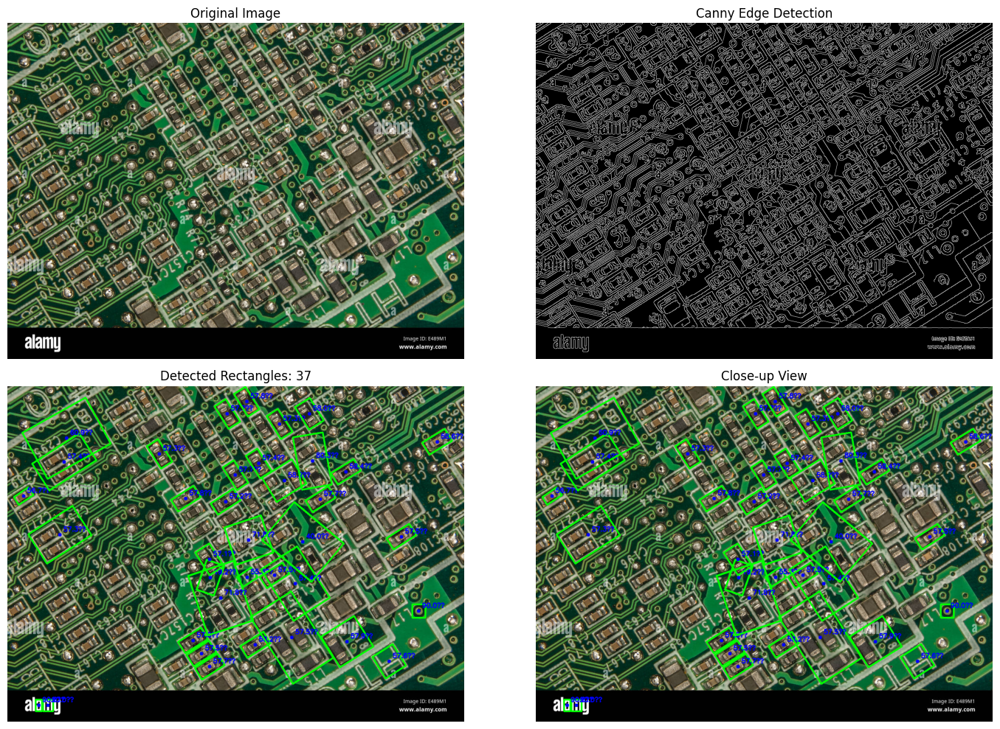

Found 37 rectangles

Advanced Rectangle Detection:


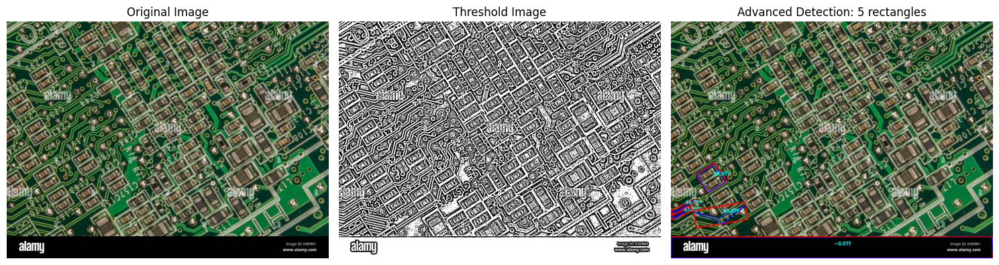

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_rectangles(image_path, min_area=1000, max_aspect_ratio=2):
    """
    Detect rectangles in an image and draw angled bounding boxes
    
    Parameters:
    image_path (str): Path to the input image
    min_area (int): Minimum area for contour detection
    max_aspect_ratio (float): Maximum aspect ratio for rectangle detection
    """
    
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not load image from {image_path}")
        return
    
    # Create a copy for drawing results
    result_image = image.copy()
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Apply edge detection
    edges = cv2.Canny(blurred, 50, 150)
    
    # Find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    rectangles_found = 0
    
    for contour in contours:
        # Calculate contour area
        area = cv2.contourArea(contour)
        
        # Filter by area
        if area < min_area:
            continue
        
        # Get rotated rectangle (angled bounding box)
        rect = cv2.minAreaRect(contour)
        box = cv2.boxPoints(rect)
        box = np.int32(box)  # Use int32 instead of int8 for coordinates
        
        # Calculate aspect ratio
        width = rect[1][0]
        height = rect[1][1]
        aspect_ratio = max(width, height) / min(width, height) if min(width, height) > 0 else 0
        
        # Filter by aspect ratio (avoid too elongated shapes)
        if aspect_ratio > max_aspect_ratio:
            continue
        
        # Draw the rotated rectangle
        cv2.drawContours(result_image, [box], 0, (0, 255, 0), 3)
        
        # Draw center point
        center_x, center_y = int(rect[0][0]), int(rect[0][1])
        cv2.circle(result_image, (center_x, center_y), 5, (255, 0, 0), -1)
        
        # Add angle information
        angle = rect[2]
        cv2.putText(result_image, f"{angle:.1f}°", (center_x + 10, center_y - 10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        
        rectangles_found += 1
    
    # Convert BGR to RGB for matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result_rgb = cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB)
    
    # Create visualization
    plt.figure(figsize=(15, 10))
    
    # Original image
    plt.subplot(2, 2, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')
    
    # Edge detection
    plt.subplot(2, 2, 2)
    plt.imshow(edges, cmap='gray')
    plt.title('Canny Edge Detection')
    plt.axis('off')
    
    # Result with rectangles
    plt.subplot(2, 2, 3)
    plt.imshow(result_rgb)
    plt.title(f'Detected Rectangles: {rectangles_found}')
    plt.axis('off')
    
    # Close-up of one rectangle (if found)
    if rectangles_found > 0:
        plt.subplot(2, 2, 4)
        plt.imshow(result_rgb)
        plt.title('Close-up View')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"Found {rectangles_found} rectangles")
    return result_image

def detect_rectangles_advanced(image_path, min_area=500, epsilon_factor=0.02):
    """
    Advanced rectangle detection using polygon approximation
    """
    
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not load image from {image_path}")
        return
    
    result_image = image.copy()
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply adaptive threshold for better contour detection
    thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                  cv2.THRESH_BINARY, 11, 2)
    
    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    rectangles_found = 0
    
    for contour in contours:
        area = cv2.contourArea(contour)
        
        if area < min_area:
            continue
        
        # Approximate contour to polygon
        epsilon = epsilon_factor * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)
        
        # Check if it's a quadrilateral (rectangle-like)
        if len(approx) == 4:
            # Get rotated rectangle
            rect = cv2.minAreaRect(contour)
            box = cv2.boxPoints(rect)
            box = np.int32(box)  # Use int32 instead of int8 for coordinates
            
            # Draw the rotated rectangle
            cv2.drawContours(result_image, [box], 0, (0, 0, 255), 3)
            
            # Draw the approximated polygon in different color
            cv2.drawContours(result_image, [approx], 0, (255, 0, 0), 2)
            
            # Add angle information
            center_x, center_y = int(rect[0][0]), int(rect[0][1])
            angle = rect[2]
            cv2.putText(result_image, f"{angle:.1f}°", (center_x + 10, center_y - 10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)
            
            rectangles_found += 1
    
    # Display results
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(thresh, cmap='gray')
    plt.title('Threshold Image')
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Advanced Detection: {rectangles_found} rectangles')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return result_image

# Example usage
if __name__ == "__main__":
    # Replace with your image path
    image_path = "/home/armo38/Downloads/macro-photo-of-surface-mount-smt-circuit-board-motherboard-showing-E489M1.jpg"  # Change this to your image file path
    
    print("Basic Rectangle Detection:")
    result1 = detect_rectangles(image_path, min_area=500)  # Lower min_area for circuit boards
    
    print("\nAdvanced Rectangle Detection:")
    result2 = detect_rectangles_advanced(image_path, min_area=300)
    
    # Optional: Save results
    # cv2.imwrite('rectangles_detected.jpg', result1)
    # cv2.imwrite('rectangles_advanced.jpg', result2)

Advanced Green Removal:


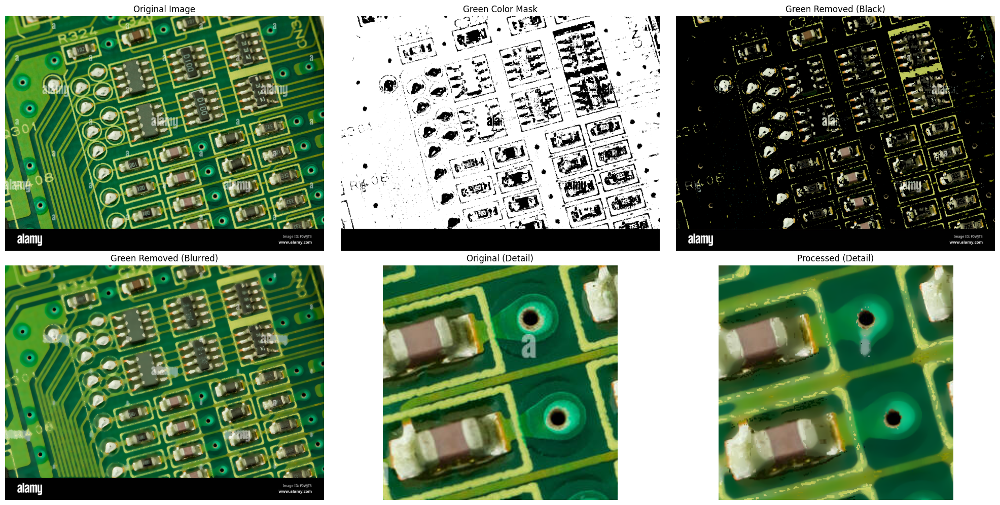

Saved black background version: image_without_green_black.jpg
Saved blurred background version: image_without_green_blurred.jpg

Simple Green Removal:


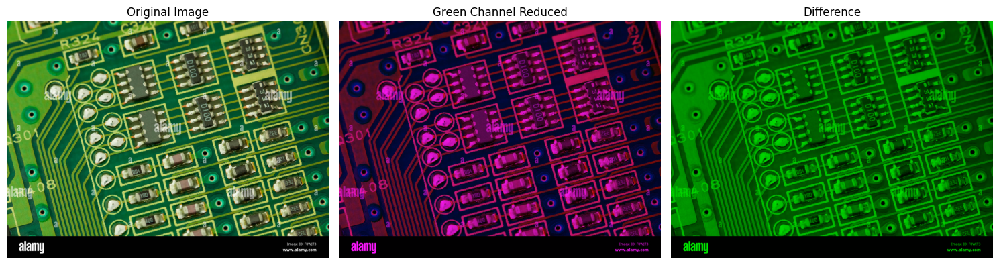

Saved simple green removal: image_simple_no_green.jpg


In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def remove_green_color(image_path, output_path=None, green_threshold=40):
    """
    Remove green color from an image and save the result
    
    Parameters:
    image_path (str): Path to the input image
    output_path (str): Path to save the output image (optional)
    green_threshold (int): Sensitivity for detecting green (0-100)
    """
    
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not load image from {image_path}")
        return
    
    # Convert BGR to HSV color space (better for color detection)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # Define range for green color in HSV
    # You can adjust these values to target specific shades of green
    lower_green = np.array([35, 40, 40])
    upper_green = np.array([85, 255, 255])
    
    # Create mask for green regions
    green_mask = cv2.inRange(hsv, lower_green, upper_green)
    
    # Invert the mask to keep non-green areas
    non_green_mask = cv2.bitwise_not(green_mask)
    
    # Method 1: Remove green by making it black
    result_black = image.copy()
    result_black[green_mask > 0] = [0, 0, 0]  # Set green pixels to black
    
    # Method 2: Remove green by making it transparent (requires PNG)
    # This creates a 4-channel image with alpha transparency
    result_transparent = cv2.cvtColor(image, cv2.COLOR_BGR2BGRA)
    result_transparent[:, :, 3] = non_green_mask  # Set alpha channel
    
    # Method 3: Remove green by replacing with average of surrounding colors
    result_blurred = image.copy()
    
    # Create a blurred version of the image
    blurred = cv2.medianBlur(image, 15)
    
    # Replace green areas with blurred content
    result_blurred[green_mask > 0] = blurred[green_mask > 0]
    
    # Convert images for display
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result_black_rgb = cv2.cvtColor(result_black, cv2.COLOR_BGR2RGB)
    result_blurred_rgb = cv2.cvtColor(result_blurred, cv2.COLOR_BGR2RGB)
    
    # Create visualization
    plt.figure(figsize=(20, 10))
    
    # Original image
    plt.subplot(2, 3, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')
    
    # Green mask
    plt.subplot(2, 3, 2)
    plt.imshow(green_mask, cmap='gray')
    plt.title('Green Color Mask')
    plt.axis('off')
    
    # Result with black background
    plt.subplot(2, 3, 3)
    plt.imshow(result_black_rgb)
    plt.title('Green Removed (Black)')
    plt.axis('off')
    
    # Result with blurred background
    plt.subplot(2, 3, 4)
    plt.imshow(result_blurred_rgb)
    plt.title('Green Removed (Blurred)')
    plt.axis('off')
    
    # Close-up comparison
    plt.subplot(2, 3, 5)
    # Show a small region for detail comparison
    h, w = image.shape[:2]
    crop_size = min(h, w) // 4
    crop_original = image_rgb[h//2:h//2+crop_size, w//2:w//2+crop_size]
    plt.imshow(crop_original)
    plt.title('Original (Detail)')
    plt.axis('off')
    
    plt.subplot(2, 3, 6)
    crop_result = result_blurred_rgb[h//2:h//2+crop_size, w//2:w//2+crop_size]
    plt.imshow(crop_result)
    plt.title('Processed (Detail)')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Save the results
    if output_path:
        # Save black background version
        cv2.imwrite(output_path.replace('.', '_black.'), result_black)
        print(f"Saved black background version: {output_path.replace('.', '_black.')}")
        
        # Save blurred background version
        cv2.imwrite(output_path.replace('.', '_blurred.'), result_blurred)
        print(f"Saved blurred background version: {output_path.replace('.', '_blurred.')}")
        
        # Save transparent version (PNG)
        if output_path.lower().endswith('.png'):
            cv2.imwrite(output_path.replace('.', '_transparent.'), result_transparent)
            print(f"Saved transparent version: {output_path.replace('.', '_transparent.')}")
    
    return result_black, result_blurred, result_transparent

def remove_green_simple(image_path, output_path=None):
    """
    Simple method to remove green by reducing green channel
    """
    
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not load image from {image_path}")
        return
    
    # Simple method: Reduce green channel intensity
    result_simple = image.copy()
    result_simple[:, :, 1] = result_simple[:, :, 1] * 0.1  # Reduce green channel to 10%
    
    # Convert for display
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result_simple_rgb = cv2.cvtColor(result_simple, cv2.COLOR_BGR2RGB)
    
    # Display comparison
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(result_simple_rgb)
    plt.title('Green Channel Reduced')
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    # Show difference
    diff = cv2.absdiff(image, result_simple)
    diff_rgb = cv2.cvtColor(diff, cv2.COLOR_BGR2RGB)
    plt.imshow(diff_rgb)
    plt.title('Difference')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    if output_path:
        cv2.imwrite(output_path, result_simple)
        print(f"Saved simple green removal: {output_path}")
    
    return result_simple

# Example usage
if __name__ == "__main__":
    # Replace with your image path
    input_image = "/home/armo38/Downloads/circuit-board-components-closeup-showing-conductive-traces-micro-ic-F0WJT3.jpg"
    output_image = "image_without_green.jpg"
    
    print("Advanced Green Removal:")
    result1, result2, result3 = remove_green_color(input_image, output_image)
    
    print("\nSimple Green Removal:")
    result4 = remove_green_simple(input_image, "image_simple_no_green.jpg")

=== Harsh Green Removal ===


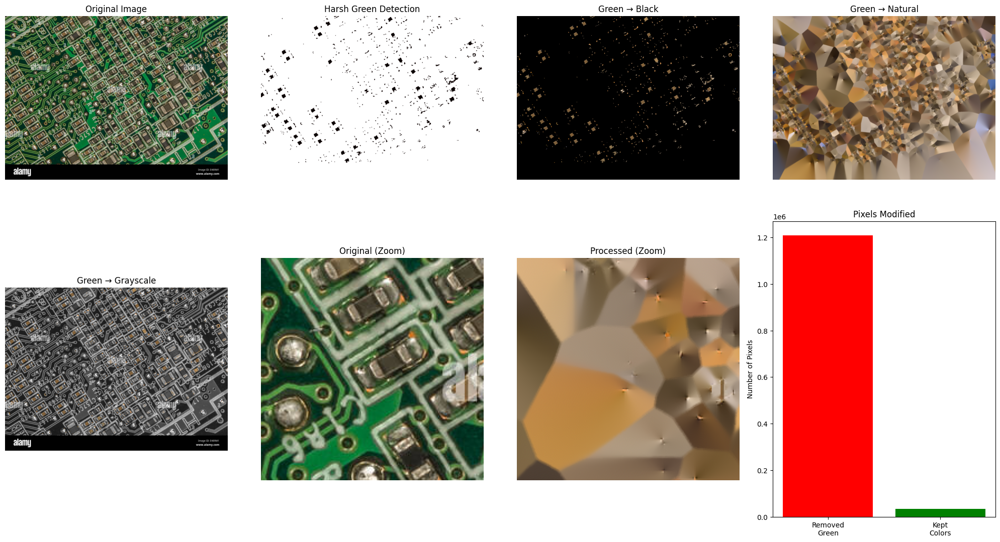

Saved results:
- no_harsh_green_black.jpg
- no_harsh_green_natural.jpg
- no_harsh_green_desaturated.jpg
Removed 1208973 harsh green pixels

=== Quick Harsh Green Removal ===
Removed harsh green and saved: quick_no_green.jpg
Modified 46627 pixels

=== Green Detection Adjustment ===


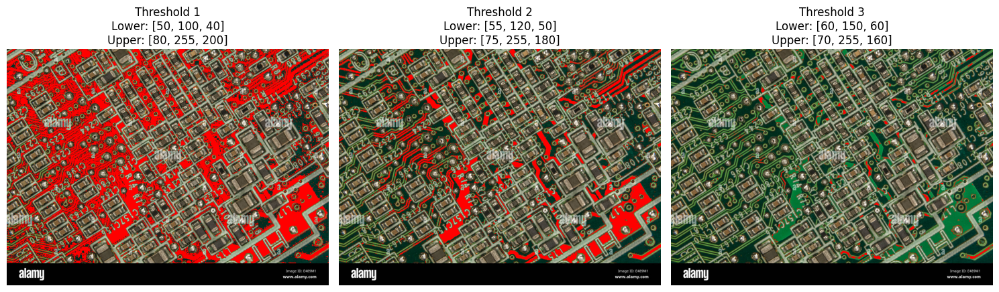

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def remove_harsh_green(image_path, output_path=None, sensitivity=30):
    """
    Remove only harsh/dominant green colors from an image
    
    Parameters:
    image_path (str): Path to the input image
    output_path (str): Path to save the output image
    sensitivity (int): How strict to be with green detection (0-100)
    """
    
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not load image from {image_path}")
        return
    
    # Convert to different color spaces for better green detection
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    
    # Method 1: Strict HSV range for harsh green only
    # Narrow range for pure green colors
    lower_green1 = np.array([50, 120, 40])    # High saturation, medium hue
    upper_green1 = np.array([80, 255, 220])   # Pure green range
    
    # Method 2: Even stricter range for very dominant green
    lower_green2 = np.array([55, 150, 50])    # Very high saturation
    upper_green2 = np.array([75, 255, 200])   # Very pure green
    
    # Create masks for harsh green
    harsh_green_mask1 = cv2.inRange(hsv, lower_green1, upper_green1)
    harsh_green_mask2 = cv2.inRange(hsv, lower_green2, upper_green2)
    
    # Combine masks
    harsh_green_mask = cv2.bitwise_or(harsh_green_mask1, harsh_green_mask2)
    
    # Method 3: Use LAB color space for additional detection
    # In LAB, green typically has specific a-channel values
    L, A, B = cv2.split(lab)
    
    # Green areas usually have lower A channel values
    lab_green_mask = cv2.inRange(A, 0, 130)  # Adjust based on your image
    
    # Combine HSV and LAB masks
    final_green_mask = cv2.bitwise_or(harsh_green_mask, lab_green_mask)
    
    # Clean up the mask
    kernel = np.ones((3,3), np.uint8)
    final_green_mask = cv2.morphologyEx(final_green_mask, cv2.MORPH_CLOSE, kernel)
    final_green_mask = cv2.morphologyEx(final_green_mask, cv2.MORPH_OPEN, kernel)
    
    # Method 1: Replace harsh green with black
    result_black = image.copy()
    result_black[final_green_mask > 0] = [0, 0, 0]
    
    # Method 2: Replace harsh green with surrounding average (better for natural look)
    result_natural = image.copy()
    
    # Create inpainted version for natural removal
    inpaint_radius = 3
    inpainted = cv2.inpaint(image, final_green_mask, inpaint_radius, cv2.INPAINT_TELEA)
    
    # Only replace the green areas with inpainted content
    result_natural[final_green_mask > 0] = inpainted[final_green_mask > 0]
    
    # Method 3: Desaturate only green areas (make them gray)
    result_desaturated = image.copy()
    gray_version = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray_version_bgr = cv2.cvtColor(gray_version, cv2.COLOR_GRAY2BGR)
    result_desaturated[final_green_mask > 0] = gray_version_bgr[final_green_mask > 0]
    
    # Visualization
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result_black_rgb = cv2.cvtColor(result_black, cv2.COLOR_BGR2RGB)
    result_natural_rgb = cv2.cvtColor(result_natural, cv2.COLOR_BGR2RGB)
    result_desaturated_rgb = cv2.cvtColor(result_desaturated, cv2.COLOR_BGR2RGB)
    
    # Create detailed visualization
    plt.figure(figsize=(20, 12))
    
    # Original
    plt.subplot(2, 4, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')
    
    # Green mask
    plt.subplot(2, 4, 2)
    plt.imshow(final_green_mask, cmap='hot')
    plt.title('Harsh Green Detection')
    plt.axis('off')
    
    # Black replacement
    plt.subplot(2, 4, 3)
    plt.imshow(result_black_rgb)
    plt.title('Green → Black')
    plt.axis('off')
    
    # Natural replacement
    plt.subplot(2, 4, 4)
    plt.imshow(result_natural_rgb)
    plt.title('Green → Natural')
    plt.axis('off')
    
    # Desaturated
    plt.subplot(2, 4, 5)
    plt.imshow(result_desaturated_rgb)
    plt.title('Green → Grayscale')
    plt.axis('off')
    
    # Close-up original
    plt.subplot(2, 4, 6)
    h, w = image.shape[:2]
    crop = image_rgb[h//3:h//3+200, w//3:w//3+200]
    plt.imshow(crop)
    plt.title('Original (Zoom)')
    plt.axis('off')
    
    # Close-up processed
    plt.subplot(2, 4, 7)
    crop_proc = result_natural_rgb[h//3:h//3+200, w//3:w//3+200]
    plt.imshow(crop_proc)
    plt.title('Processed (Zoom)')
    plt.axis('off')
    
    # Color analysis
    plt.subplot(2, 4, 8)
    colors = ['Removed\nGreen', 'Kept\nColors']
    counts = [np.sum(final_green_mask > 0), np.sum(final_green_mask == 0)]
    plt.bar(colors, counts, color=['red', 'green'])
    plt.title('Pixels Modified')
    plt.ylabel('Number of Pixels')
    
    plt.tight_layout()
    plt.show()
    
    # Save results
    if output_path:
        base_name = output_path.split('.')[0]
        extension = output_path.split('.')[-1]
        
        cv2.imwrite(f"{base_name}_black.{extension}", result_black)
        cv2.imwrite(f"{base_name}_natural.{extension}", result_natural)
        cv2.imwrite(f"{base_name}_desaturated.{extension}", result_desaturated)
        
        print(f"Saved results:")
        print(f"- {base_name}_black.{extension}")
        print(f"- {base_name}_natural.{extension}")
        print(f"- {base_name}_desaturated.{extension}")
    
    print(f"Removed {np.sum(final_green_mask > 0)} harsh green pixels")
    
    return result_black, result_natural, result_desaturated, final_green_mask

def adjust_green_detection(image_path):
    """
    Interactive function to adjust green detection parameters
    """
    image = cv2.imread(image_path)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # Test different thresholds
    thresholds = [
        ([50, 100, 40], [80, 255, 200]),   # Broad green
        ([55, 120, 50], [75, 255, 180]),   # Medium strict
        ([60, 150, 60], [70, 255, 160]),   # Very strict
    ]
    
    plt.figure(figsize=(15, 10))
    
    for i, (lower, upper) in enumerate(thresholds):
        mask = cv2.inRange(hsv, np.array(lower), np.array(upper))
        result = image.copy()
        result[mask > 0] = [0, 0, 255]  # Mark green areas in red
        
        plt.subplot(2, 3, i+1)
        plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
        plt.title(f'Threshold {i+1}\nLower: {lower}\nUpper: {upper}')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Quick harsh green removal function
def quick_remove_harsh_green(image_path, output_path):
    """
    Quick removal of only harsh green colors
    """
    image = cv2.imread(image_path)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # Very strict range for harsh green only
    lower_green = np.array([58, 140, 50])   # High saturation, pure green
    upper_green = np.array([72, 255, 180])  # Very specific green range
    
    mask = cv2.inRange(hsv, lower_green, upper_green)
    
    # Remove green (make black)
    result = image.copy()
    result[mask > 0] = [0, 0, 0]
    
    cv2.imwrite(output_path, result)
    print(f"Removed harsh green and saved: {output_path}")
    print(f"Modified {np.sum(mask > 0)} pixels")
    
    return result

# Example usage
if __name__ == "__main__":
    input_image = "/home/armo38/Downloads/macro-photo-of-surface-mount-smt-circuit-board-motherboard-showing-E489M1.jpg"
    output_image = "no_harsh_green.jpg"
    
    print("=== Harsh Green Removal ===")
    result1, result2, result3, mask = remove_harsh_green(input_image, output_image)
    
    print("\n=== Quick Harsh Green Removal ===")
    quick_result = quick_remove_harsh_green(input_image, "quick_no_green.jpg")
    
    print("\n=== Green Detection Adjustment ===")
    adjust_green_detection(input_image)

In [15]:
import cv2
import numpy as np

def reduce_greens_to_white_opencv(input_path, output_path, green_threshold=100, saturation_threshold=50):
    """
    Reduce harsh greens to white in an image
    
    Args:
        input_path: Path to input image
        output_path: Path to save output image
        green_threshold: Threshold for green intensity (0-255)
        saturation_threshold: Threshold for saturation level (0-255)
    """
    # Read the image
    img = cv2.imread(input_path)
    if img is None:
        print("Error: Could not load image")
        return
    
    # Convert BGR to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    # Convert BGR to RGB for green channel analysis
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Create mask for green pixels
    green_channel = rgb[:, :, 1]  # Green channel in RGB
    saturation = hsv[:, :, 1]     # Saturation channel in HSV
    
    # Create mask: pixels that are green AND saturated
    green_mask = (green_channel > green_threshold) & (saturation > saturation_threshold)
    
    # Convert mask to 3 channels
    green_mask_3d = np.stack([green_mask] * 3, axis=-1)
    
    # Create white image
    white_image = np.ones_like(img) * 255
    
    # Replace green pixels with white
    result = np.where(green_mask_3d, white_image, img)
    
    # Save the result
    cv2.imwrite(output_path, result)
    print(f"Image saved to: {output_path}")

# Usage example
if __name__ == "__main__":
    input_image = "/home/armo38/Downloads/macro-photo-of-surface-mount-smt-circuit-board-motherboard-showing-E489M1.jpg"  # Replace with your input image path
    output_image = "output.jpg"  # Replace with your desired output path
    
    reduce_greens_to_white_opencv(input_image, output_image)

Image saved to: output.jpg
